### Import

In [72]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations_with_replacement
from numpy.linalg import qr, norm
import open3d as o3d

In [73]:
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import numpy as np

def draw3DPoints(x, y, z, point_size = 1.5, title = '3D Scatter plot', show = False, color = None, colorscale='Viridis'):
    """
    X: np.ndarray (3, n) vertices
    """

    trace = go.Scatter3d(
                visible=True,
                x=x,
                y=y,
                z=z,
                mode='markers', marker=dict(
                    size=point_size,
                    color=color,  # set color to an array/list of desired values
                ),
            )
    
    layout = go.Layout(title=title,
            scene = bound_scene(x, y, z),
            width = 600,
            height = 600)

    fig = go.Figure(data=[trace], layout=layout)
    if show: fig.show()
    return fig

def bound_scene(x, y, z, margin = 0.1):
    x_range = np.max(x) - np.min(x)
    y_range = np.max(y) - np.min(y)
    z_range = np.max(z) - np.min(z)
    max_range = max(x_range, max(y_range, z_range))

    x_min, x_max = np.min(x) - x_range*margin, np.max(x) + x_range*margin
    y_min, y_max = np.min(y) - y_range*margin, np.max(y) + y_range*margin
    z_min, z_max = np.min(z) - z_range*margin, np.max(z) + z_range*margin
    
    scene = dict(
                xaxis = dict(range=[x_min, x_max],),
                yaxis = dict(range=[y_min, y_max],),
                zaxis = dict(range=[z_min, z_max],),
                aspectratio = dict(x=(x_max - x_min)/(1.25*max_range),
                                    y=(y_max - y_min)/(1.25*max_range),
                                    z=(z_max - z_min)/(1.25*max_range))
            )
            
    return scene

### Create Stanford bunny point cloud and normalize to [-1,1]

In [74]:
# Load the Stanford Bunny mesh
bunny = o3d.data.BunnyMesh()
mesh = o3d.io.read_triangle_mesh(bunny.path)
# mesh = mesh.subdivide_midpoint(number_of_iterations=1)
mesh.compute_vertex_normals()

# sample points from the mesh
n_points = 2048
points = mesh.sample_points_poisson_disk(n_points)
points = np.asarray(points.points)
points = points[:, [0,2,1]]
print(points.shape)
# visualize the point cloud via plotly
fig = draw3DPoints(points[:, 0], points[:, 1], points[:, 2], point_size=1.5, title='Stanford Bunny Point Cloud', show=True)

(2048, 3)


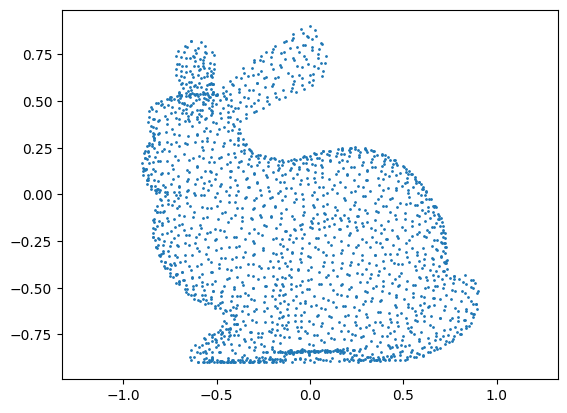

(2048, 3)


In [81]:
# Normalize the point cloud to [-1, 1]
pcl = points.copy()
pcl = (pcl - pcl.min(axis=0)) / (pcl.max(axis=0) - pcl.min(axis=0))
pcl = 2 * pcl - 1
pcl = pcl * 0.9 # Scale the point cloud

# Visualize the normalized point cloud
plt.figure()
plt.scatter(pcl[:, 0], pcl[:, 2], s=1)
plt.axis('equal')
plt.show()

print(pcl.shape)


### Cholesky inverse version

In [76]:
import numpy as np
import time
import matplotlib.pyplot as plt
from itertools import combinations_with_replacement
from scipy.linalg import cho_factor, cho_solve

def generate_monomials(X, degree):
    """
    Generate monomials up to a given degree for d-dimensional points.

    Parameters:
        X (ndarray): An array of shape (N, d) representing the point cloud.
        degree (int): The maximum degree of the monomials.

    Returns:
        ndarray: Monomial matrix of shape (N, M).
    """
    N, d = X.shape
    exponents = []
    # Generate all multi-indices with total degree up to 'degree'
    for total_degree in range(degree + 1):
        for exps in combinations_with_replacement(range(d), total_degree):
            exp = np.zeros(d, dtype=int)
            for var in exps:
                exp[var] += 1
            exponents.append(exp)
    M = len(exponents)
    print(f'Number of monomials: {M}') # Number of polynomials: n1 + n2 + ... + n_d = degree; degree + (d-1) choose (d-1); (d-1) number of dividers for an array in space R^d.
    monomials = np.ones((N, M))
    for i, exp in enumerate(exponents):
        monomials[:, i] = np.prod(X ** exp, axis=1) # x1^exp1 * x2^exp2 * ... * xd^expd. e.g. x1^2 * x2^3 * x3^1 \in R^3
    return monomials

def generate_chebyshev_polynomials(X, degree):
    """
    Generate Chebyshev polynomials up to a given degree for d-dimensional points.

    Parameters:
        X (ndarray): An array of shape (N, d) representing the d-dimensional point cloud.
        degree (int): The maximum degree of the polynomials.

    Returns:
        ndarray: Chebyshev polynomial matrix of shape (N, M).
    """
    N, d = X.shape
    exponents = []
    # Generate all multi-indices with total degree up to 'degree'
    for total_degree in range(degree + 1):
        for exps in combinations_with_replacement(range(d), total_degree):
            exp = np.zeros(d, dtype=int)
            for var in exps:
                exp[var] += 1
            exponents.append(exp)
    M = len(exponents)
    print(f'Number of Chebyshev polynomials: {M}') # Number of polynomials: n1 + n2 + ... + n_d = degree; degree + (d-1) choose (d-1); (d-1) number of dividers for an array in space R^d.
    cheby_polynomials = np.ones((N, M))
    for i, exp in enumerate(exponents):
        cheby_polynomials[:, i] = np.prod(np.cos(exp * np.arccos(X)), axis=1)
    return cheby_polynomials

def approximate_density(X, degree, poly=generate_monomials, grid_size=100, reg=1e-10, ax_lim=1.0):
    """
    Approximate the density on a grid using the Christoffel function.

    Parameters:
        X (ndarray): The original point cloud of shape (N, d).
        degree (int): The maximum degree of the polynomials.
        grid_size (int): The size of the grid for visualization.

    Returns:
        ndarray: Grid of x coordinates.
        ndarray: Grid of y coordinates.
        ndarray: Estimated density values on the grid.
    """
    N, d = X.shape
    # Generate monomials at data points
    M_X = poly(X, degree)
    # Compute empirical covariance matrix
    time_start = time.time()
    S = (M_X.T @ M_X) / N
    print(f'Time for covariance computation: {time.time() - time_start:.2f}s')
    # Invert covariance matrix with regularization
    M = S.shape[0]
    S_reg = S + reg * np.eye(M)
    # Use Cholesky decomposition for numerical stability
    time_start = time.time()
    c, lower = cho_factor(S_reg)
    print(f'Time for Cholesky decomposition: {time.time() - time_start:.2f}s')
    time_start = time.time()
    S_inv = cho_solve((c, lower), np.eye(M))
    print(f'Time for Cholesky inverse computation: {time.time() - time_start:.2f}s')
    # Create a grid over the domain
    # x_min, x_max = X[:, 0].min() - 0.2, X[:, 0].max() + 0.2
    # y_min, y_max = X[:, 1].min() - 0.2, X[:, 1].max() + 0.2
    # xx, yy = np.meshgrid(np.linspace(-ax_lim, ax_lim, grid_size),
    #                      np.linspace(-ax_lim, ax_lim, grid_size))
    # grid_points = np.column_stack([xx.ravel(), yy.ravel()])
    r = [np.linspace(-ax_lim, ax_lim, grid_size) for _ in range(d)]
    grids =np.meshgrid(*r)
    grid_points = np.column_stack([grid.ravel() for grid in grids])
    # Compute monomials at grid points
    M_grid = poly(grid_points, degree)
    # Compute Christoffel function at grid points
    time_start = time.time()
    # kappas = np.einsum('ij,jk,ik->i', M_grid, S_inv, M_grid)
    kappas = np.sum(M_grid @ S_inv * M_grid, axis=1)
    print(f'Time for Christoffel function computation: {time.time() - time_start:.2f}s')
    # Compute density estimates
    densities = 1 / kappas
    # make a tuple of grid_size to degree d
    densities = densities.reshape([grid_size]*d)
    return grids, densities

In [77]:
# Set the degree of polynomials
degree = 10
# Approximate density
grids, density = approximate_density(pcl, degree, poly=generate_monomials, grid_size=30, reg=1e-10)
print(density.min(), density.max())
xx, yy, zz = grids
# values = density
values = np.log(density + 1e-10)
print(values.min(), values.max())

Number of monomials: 286
Time for covariance computation: 0.00s
Time for Cholesky decomposition: 0.00s
Time for Cholesky inverse computation: 0.00s
Number of monomials: 286
Time for Christoffel function computation: 0.02s
8.26721265856687e-13 0.01042611179088968
-23.017617703498754 -4.563441860784192


In [78]:
x, y, z = pcl[:, 0], pcl[:, 1], pcl[:, 2]
fig = go.Figure(
    data=[go.Volume(
        x=xx.flatten(),
        y=yy.flatten(),
        z=zz.flatten(),
        value=density.flatten(),
        opacity=0.1, # needs to be small to see through all surfaces
        surface_count=25, # number of isosurfaces
    ),
    go.Scatter3d(
        x=pcl[:, 0],
        y=pcl[:, 1],
        z=pcl[:, 2],
        mode='markers',
        marker=dict(
            size=1.0,
            color='white',
        ),
    )],
    layout=go.Layout(title='density map',
            scene = bound_scene(x, y, z, margin=0.0),
            width = 600,
            height = 600)
)
fig.show()
# fig.write_html('density_monomials.html')

In [79]:
# Set the degree of polynomials
degree = 10
# Approximate density
grids, density = approximate_density(pcl, degree, poly=generate_chebyshev_polynomials, grid_size=30, reg=1e-10)
print(density.min(), density.max())
xx, yy, zz = grids
# values = density
values = np.log(density + 1e-10)
print(values.min(), values.max())

Number of Chebyshev polynomials: 286
Time for covariance computation: 0.00s
Time for Cholesky decomposition: 0.00s
Time for Cholesky inverse computation: 0.00s
Number of Chebyshev polynomials: 286


Time for Christoffel function computation: 0.02s
1.1440751551826617e-12 0.008744539108557603
-23.014475128867907 -4.739325863888682


In [80]:
x, y, z = pcl[:, 0], pcl[:, 1], pcl[:, 2]
fig = go.Figure(
    data=[go.Volume(
        x=xx.flatten(),
        y=yy.flatten(),
        z=zz.flatten(),
        value=density.flatten(),
        opacity=0.1, # needs to be small to see through all surfaces
        surface_count=25, # number of isosurfaces
    ),
    go.Scatter3d(
        x=pcl[:, 0],
        y=pcl[:, 1],
        z=pcl[:, 2],
        mode='markers',
        marker=dict(
            size=1.0,
            color='white',
        ),
    )],
    layout=go.Layout(title='density map',
            scene = bound_scene(x, y, z, margin=0.0),
            width = 600,
            height = 600)
)
fig.show()
# fig.write_html('density_monomials.html')